In [ ]:
#!python -m pip install --upgrade pip

#!pip install tensorflow==2.3.1

#!pip install tensorboard==2.4.1
#!pip install torch

In [1]:
import torch

In [2]:
from IPython.display import Image

In [3]:
from google.colab import drive

In [4]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
%cd '/content/drive/My Drive/image_detection'

/content/drive/My Drive/image_detection


In [6]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [7]:
%cd '/content/drive/My Drive/image_detection/yolov5'

/content/drive/My Drive/image_detection/yolov5


In [8]:
!pip install -r requirements.txt

In [ ]:
import os
from random import choice
import shutil

#arrays to store file names
imgs =[]
xmls =[]

#setup dir names
trainPath = '/content/drive/My Drive/image_detection/Dataset/images/train'
valPath = '/content/drive/My Drive/image_detection/Dataset/images/val'
crsPath = '/content/drive/My Drive/image_detection/archive/ts/ts' #dir where images and annotations stored

#setup ratio (val ratio = rest of the files in origin dir after splitting into train and test)
train_ratio = 0.8
val_ratio = 0.2


#total count of imgs
totalImgCount = len(os.listdir(crsPath))/2

#soring files to corresponding arrays
for (dirname, dirs, files) in os.walk(crsPath):
    for filename in files:
        if filename.endswith('.txt'):
            xmls.append(filename)
        else:
            imgs.append(filename)


#counting range for cycles
countForTrain = int(len(imgs)*train_ratio)
countForVal = int(len(imgs)*val_ratio)
print("training images are : ",countForTrain)
print("Validation images are : ",countForVal)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/image_detection/archive/ts/ts'

Here I already seperated imgs and xmls from the archive folder to dataset folder so i accendently run this cell but there is no data in archive folder that's why i got this error

In [ ]:
trainimagePath = '/content/drive/My Drive/image_detection/Dataset/images/train'
trainlabelPath = '/content/drive/My Drive/image_detection/Dataset/labels/train'
valimagePath = '/content/drive/My Drive/image_detection/Dataset/images/val'
vallabelPath = '/content/drive/My Drive/image_detection/Dataset/labels/val'
#cycle for train dir
for x in range(countForTrain):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))


    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)



#cycle for test dir
for x in range(countForVal):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))

    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

#rest of files will be validation files, so rename origin dir to val dir
#os.rename(crsPath, valPath)
shutil.move(crsPath, valPath)

'/content/drive/My Drive/image_detection/Dataset/images/val/ts'

Create dataset.yaml move the dataset's dataset.yaml file to the /yolov5/data directory.

In [9]:
!python train.py --img 415 --batch 16 --epochs 30 --data dataset.yaml --weights yolov5s.pt --cache


2024-04-29 13:23:06.622632: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-29 13:23:06.622687: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-29 13:23:06.624178: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=415, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, opt

In [10]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

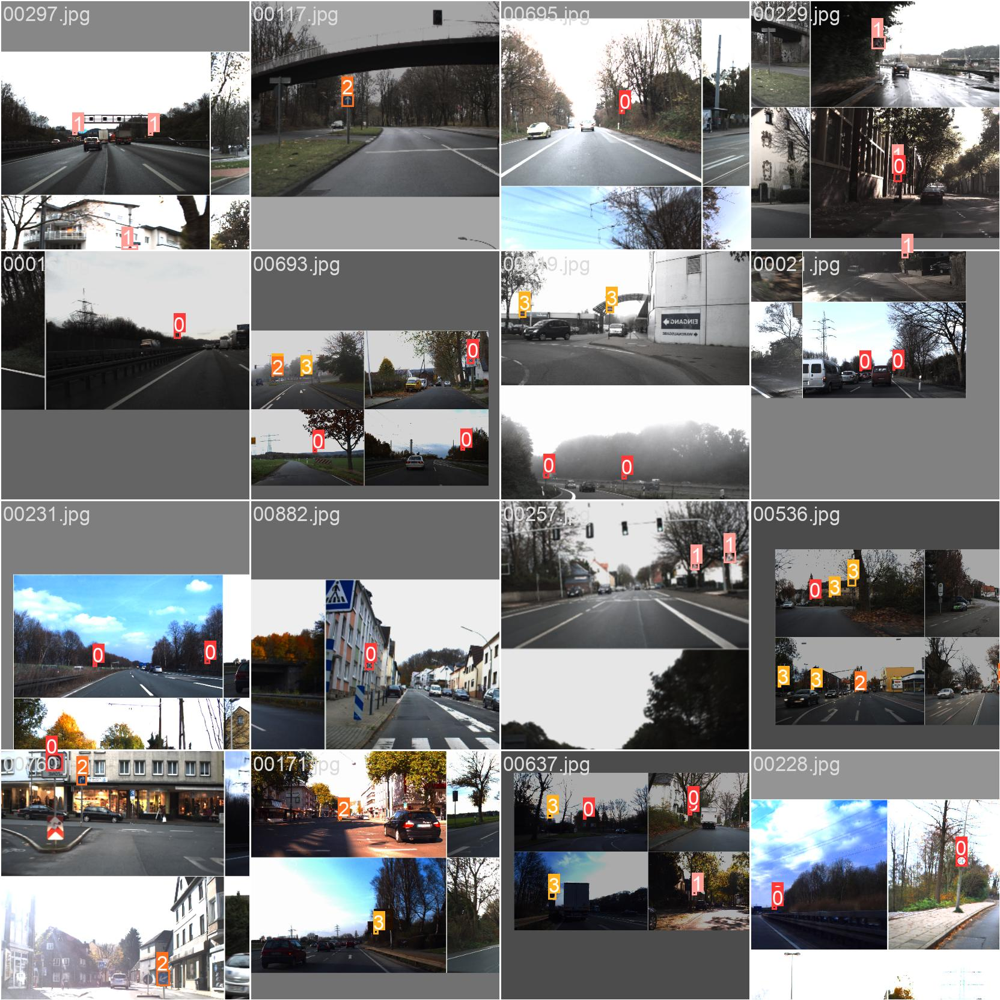

In [11]:
Image(filename='runs/train/exp4/train_batch0.jpg', width=416)

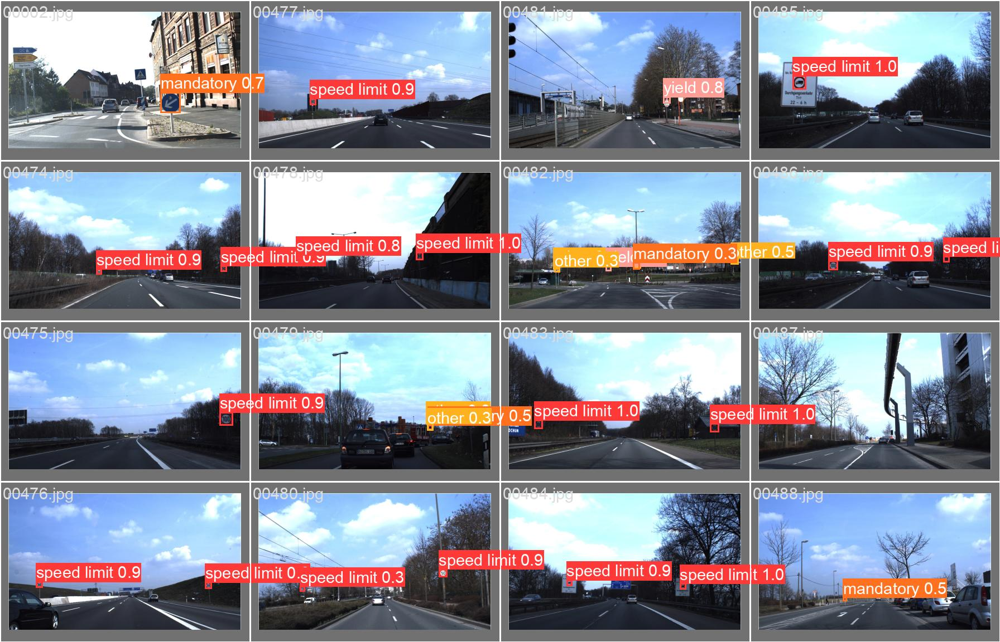

In [12]:
Image(filename='runs/train/exp4/val_batch0_pred.jpg', width=416)

In [15]:
!python detect.py --source runs/train/exp4/test.jpg --weights runs/train/exp4/weights/best.pt --conf 0.25

detect: weights=['runs/train/exp4/weights/best.pt'], source=runs/train/exp4/test.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-306-gb599ae42 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/image_detection/yolov5/runs/train/exp4/test.jpg: 352x640 2 speed limits, 46.9ms
Speed: 0.6ms pre-process, 46.9ms inference, 520.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


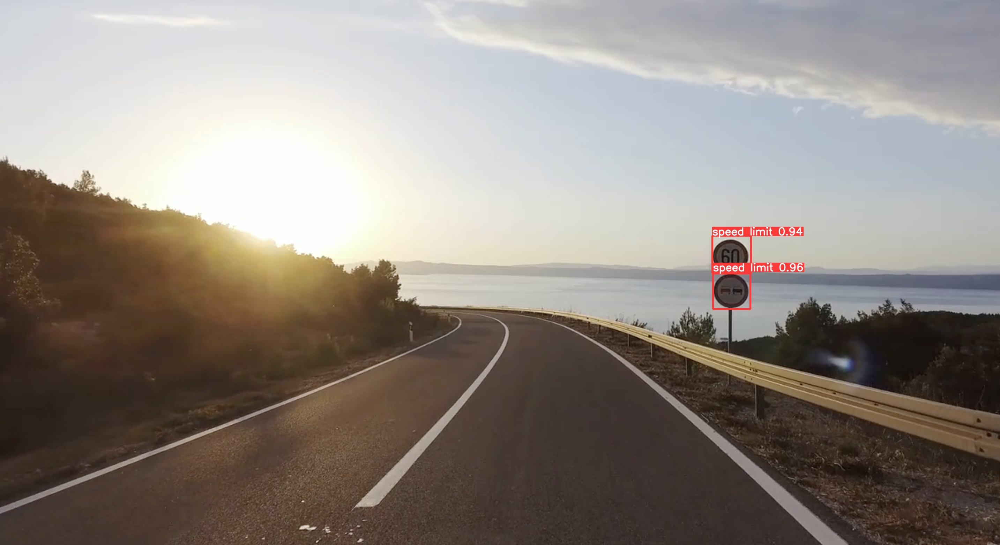

In [16]:
Image(filename='runs/detect/exp3/test.jpg', width=416)